In [33]:
import numpy as np
import csv
import math
import statistics
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

import numpy
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

/Users/michellezhao/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


# Make sport dictionary - Males Only

In [2]:
datafile = 'data/athlete_events.txt'
athlete_dictionary = {}
sport_dictionary = {}


with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        index = row[0]
        name = row[1]
        sex = row[2]
        age = row[3]
        height = row[4]
        weight = row[5]
        team = row[6]
        noc = row[7]
        games = row[8]
        year = row[9]
        season = row[10]
        city = row[11]
        sport = row[12]
        event = row[13]
        medal = row[14]
        if sport not in sport_dictionary:
            sport_dict = {}
            ath_dict = {}
#             ath_dict['name'] = name
            # 0 - Female, 1 - Male
#             if sex == 'M':
#                 ath_dict['sex'] = 1
            if sex == 'F':
                continue
#             ath_dict['games'] = {}
            ath_dict[year] = {}
            ath_dict[year]['season'] = season
            ath_dict[year]['event'] = [(event, medal)]
            ath_dict[year]['height'] = height
            ath_dict[year]['weight'] = weight
            sport_dict[index] = ath_dict
            sport_dictionary[sport] = sport_dict
            
        elif sport in sport_dictionary:
            if index not in sport_dictionary[sport]:
                ath_dict = {}
#                 ath_dict['name'] = name
#                 # 0 - Female, 1 - Male
#                 if sex == 'M':
#                     ath_dict['sex'] = 1
                if sex == 'F':
                    continue
#                 ath_dict['games'] = {}
                ath_dict[year] = {}
                ath_dict[year]['season'] = season
                ath_dict[year]['event'] = [(event, medal)]
                ath_dict[year]['height'] = height
                ath_dict[year]['weight'] = weight
                sport_dictionary[sport][index] = ath_dict
            elif index in sport_dictionary[sport]:
                #assert(sport_dictionary[sport][index]['name'] == name)
                # 0 - Female, 1 - Male
                if year not in sport_dictionary[sport][index]:
                    sport_dictionary[sport][index][year] = {}
                    sport_dictionary[sport][index][year]['season'] = season
                    sport_dictionary[sport][index][year]['event'] = [(event, medal)]
                    sport_dictionary[sport][index][year]['height'] = height
                    sport_dictionary[sport][index][year]['weight'] = weight
                elif year in sport_dictionary[sport][index]:
                    sport_dictionary[sport][index][year]['event'].append((event, medal))


male_sports_dictionary = sport_dictionary

In [3]:
datafile = 'data/athlete_events.txt'
athlete_dictionary = {}
sport_dictionary = {}


with open(datafile, 'r') as csvfile:
    first = 1
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    for row in spamreader:
        if first ==1:
            first = 0
            continue
        index = row[0]
        name = row[1]
        sex = row[2]
        age = row[3]
        height = row[4]
        weight = row[5]
        team = row[6]
        noc = row[7]
        games = row[8]
        year = row[9]
        season = row[10]
        city = row[11]
        sport = row[12]
        event = row[13]
        medal = row[14]
        if sport not in sport_dictionary:
            sport_dict = {}
            ath_dict = {}
#             ath_dict['name'] = name
            # 0 - Female, 1 - Male
#             if sex == 'M':
#                 ath_dict['sex'] = 1
            if sex == 'M':
                continue
#             ath_dict['games'] = {}
            ath_dict[year] = {}
            ath_dict[year]['season'] = season
            ath_dict[year]['event'] = [(event, medal)]
            ath_dict[year]['height'] = height
            ath_dict[year]['weight'] = weight
            sport_dict[index] = ath_dict
            sport_dictionary[sport] = sport_dict
            
        elif sport in sport_dictionary:
            if index not in sport_dictionary[sport]:
                ath_dict = {}
#                 ath_dict['name'] = name
#                 # 0 - Female, 1 - Male
#                 if sex == 'M':
#                     ath_dict['sex'] = 1
                if sex == 'M':
                    continue
#                 ath_dict['games'] = {}
                ath_dict[year] = {}
                ath_dict[year]['season'] = season
                ath_dict[year]['event'] = [(event, medal)]
                ath_dict[year]['height'] = height
                ath_dict[year]['weight'] = weight
                sport_dictionary[sport][index] = ath_dict
            elif index in sport_dictionary[sport]:
                #assert(sport_dictionary[sport][index]['name'] == name)
                # 0 - Female, 1 - Male
                if year not in sport_dictionary[sport][index]:
                    sport_dictionary[sport][index][year] = {}
                    sport_dictionary[sport][index][year]['season'] = season
                    sport_dictionary[sport][index][year]['event'] = [(event, medal)]
                    sport_dictionary[sport][index][year]['height'] = height
                    sport_dictionary[sport][index][year]['weight'] = weight
                elif year in sport_dictionary[sport][index]:
                    sport_dictionary[sport][index][year]['event'].append((event, medal))


female_sports_dictionary = sport_dictionary

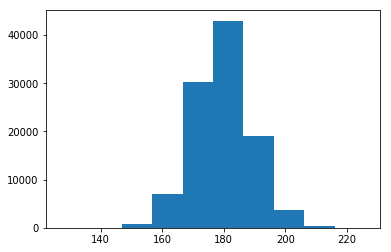

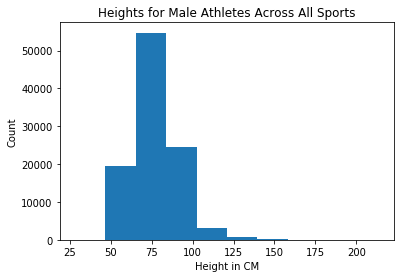

Text(0.5,0,'Weight in LB')

In [4]:
all_male_sports_heights = []
for sport in male_sports_dictionary:
    for athlete_idx in male_sports_dictionary[sport]:
#         year_avg = []
        for year in male_sports_dictionary[sport][athlete_idx]:
            if male_sports_dictionary[sport][athlete_idx][year]['height'] == 'NA':
                continue
            if math.isnan(int(male_sports_dictionary[sport][athlete_idx][year]['height'])):
                continue
            else:
                all_male_sports_heights.append(int(male_sports_dictionary[sport][athlete_idx][year]['height']))
plt.hist(all_male_sports_heights)
plt.show()
plt.title("Heights for Male Athletes Across All Sports")
plt.ylabel('Count')
plt.xlabel('Height in CM')


all_male_sports_weights = []
for sport in male_sports_dictionary:
    for athlete_idx in male_sports_dictionary[sport]:
#         year_avg = []
        for year in male_sports_dictionary[sport][athlete_idx]:
            if male_sports_dictionary[sport][athlete_idx][year]['weight'] == 'NA':
                continue
            if math.isnan(float(male_sports_dictionary[sport][athlete_idx][year]['weight'])):
                continue
            else:
                all_male_sports_weights.append(float(male_sports_dictionary[sport][athlete_idx][year]['weight']))
plt.hist(all_male_sports_weights)
plt.show()
plt.title("Weights for Male Athletes Across All Sports")
plt.ylabel('Count')
plt.xlabel('Weight in LB')

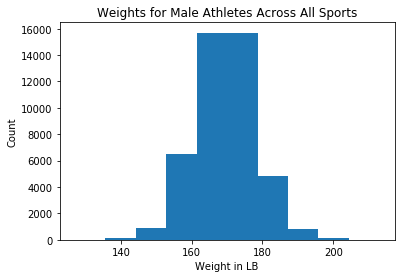

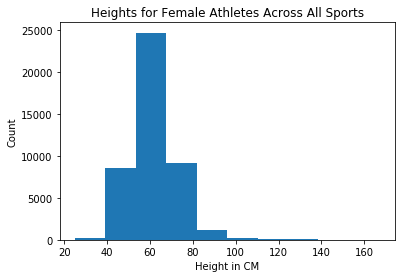

Text(0.5,0,'Weight in LB')

In [5]:
all_female_sports_heights = []
for sport in female_sports_dictionary:
    for athlete_idx in female_sports_dictionary[sport]:
#         year_avg = []
        for year in female_sports_dictionary[sport][athlete_idx]:
            if female_sports_dictionary[sport][athlete_idx][year]['height'] == 'NA':
                continue
            if math.isnan(int(female_sports_dictionary[sport][athlete_idx][year]['height'])):
                continue
            else:
                all_female_sports_heights.append(int(female_sports_dictionary[sport][athlete_idx][year]['height']))
plt.hist(all_female_sports_heights)
plt.show()
plt.title("Heights for Female Athletes Across All Sports")
plt.ylabel('Count')
plt.xlabel('Height in CM')

all_female_sports_weights = []
for sport in female_sports_dictionary:
    for athlete_idx in female_sports_dictionary[sport]:
#         year_avg = []
        for year in female_sports_dictionary[sport][athlete_idx]:
            if female_sports_dictionary[sport][athlete_idx][year]['weight'] == 'NA':
                continue
            if math.isnan(float(female_sports_dictionary[sport][athlete_idx][year]['weight'])):
                continue
            else:
                all_female_sports_weights.append(float(female_sports_dictionary[sport][athlete_idx][year]['weight']))
plt.hist(all_female_sports_weights)
plt.show()
plt.title("Weights for Female Athletes Across All Sports")
plt.ylabel('Count')
plt.xlabel('Weight in LB')

In [6]:
def make_sport_height_hist(female_sports_dictionary):
    all_sports = []
    for sport in female_sports_dictionary:
        sport_height = []
        for athlete_idx in female_sports_dictionary[sport]:
            for year in female_sports_dictionary[sport][athlete_idx]:
                if female_sports_dictionary[sport][athlete_idx][year]['height'] == 'NA':
                    continue
                if math.isnan(float(female_sports_dictionary[sport][athlete_idx][year]['height'])):
                    continue
                else:
                    sport_height.append(float(female_sports_dictionary[sport][athlete_idx][year]['height']))
        if len(sport_height)==0:
            continue
        all_sports.append(np.mean(sport_height))
    plt.hist(all_sports)
    plt.title("Height per sport")
    plt.ylabel('Count')
    plt.xlabel('Height in Cm')
    plt.show()
    
    norm_sports = (all_sports - min(all_sports))/(max(all_sports)-min(all_sports))
    plt.bar(range(len(all_sports)), norm_sports)
    plt.title("Height per sport")
    plt.ylabel('Height')
    plt.xlabel('Sport')
    plt.show()
    
def make_sport_weight_hist(female_sports_dictionary):
    all_sports = []
    for sport in female_sports_dictionary:
        sport_weight = []
        for athlete_idx in female_sports_dictionary[sport]:
            for year in female_sports_dictionary[sport][athlete_idx]:
                if female_sports_dictionary[sport][athlete_idx][year]['weight'] == 'NA':
                    continue
                if math.isnan(float(female_sports_dictionary[sport][athlete_idx][year]['weight'])):
                    continue
                else:
                    sport_weight.append(float(female_sports_dictionary[sport][athlete_idx][year]['weight']))
        if len(sport_weight)==0:
            continue
        all_sports.append(np.mean(sport_weight))
    plt.hist(all_sports)
    plt.title("Weight per sport")
    plt.ylabel('Count')
    plt.xlabel('Weight in LB')
    plt.show()
    
    norm_sports = (all_sports - min(all_sports))/(max(all_sports)-min(all_sports))
    plt.bar(range(len(all_sports)), norm_sports)
    plt.title("Weight per sport")
    plt.ylabel('Weight')
    plt.xlabel('Sport')
    plt.show()

FEMALE


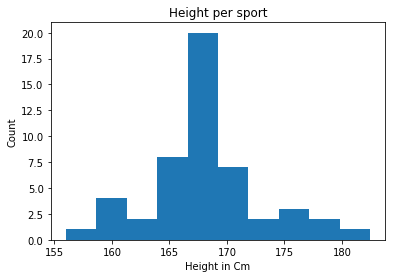

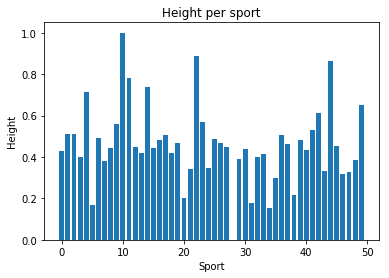

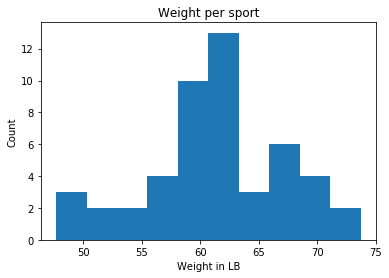

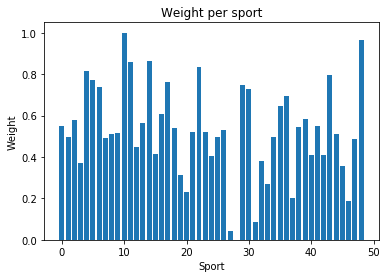

MALE


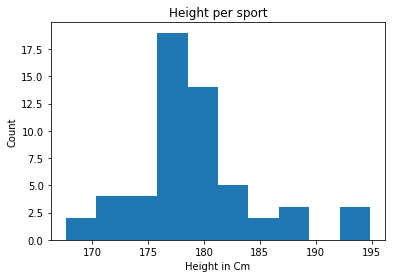

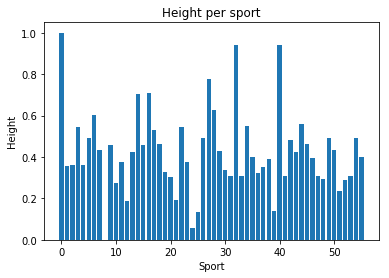

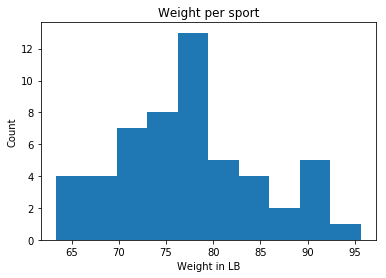

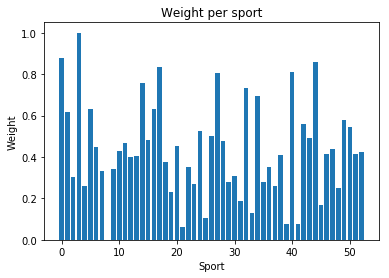

In [7]:
print("FEMALE")
make_sport_height_hist(female_sports_dictionary)
make_sport_weight_hist(female_sports_dictionary)
print("MALE")
make_sport_height_hist(male_sports_dictionary)
make_sport_weight_hist(male_sports_dictionary)

In [8]:
datafile = 'data/athlete_events.txt'
athlete_dictionary = {}
country_dictionary = {}
sport_dictionary = {}

with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        noc = row[7]
        country_dictionary[noc] = {}


with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        index = row[0]
        name = row[1]
        sex = row[2]
        age = row[3]
        height = row[4]
        weight = row[5]
        team = row[6]
        noc = row[7]
        games = row[8]
        year = row[9]
        season = row[10]
        city = row[11]
        sport = row[12]
        event = row[13]
        medal = row[14]
        
        
        if sport not in country_dictionary[noc]:
            sport_dict = {}
            ath_dict = {}
#             ath_dict['name'] = name
            # 0 - Female, 1 - Male
#             if sex == 'M':
#                 ath_dict['sex'] = 1
            if sex == 'F':
                continue
#             ath_dict['games'] = {}
            ath_dict[year] = {}
            ath_dict[year]['season'] = season
            ath_dict[year]['event'] = [(event, medal)]
            ath_dict[year]['height'] = height
            ath_dict[year]['weight'] = weight
            sport_dict[index] = ath_dict
            country_dictionary[noc][sport] = sport_dict

        elif sport in country_dictionary[noc]:
            if index not in country_dictionary[noc][sport]:
                ath_dict = {}
#                 ath_dict['name'] = name
#                 # 0 - Female, 1 - Male
#                 if sex == 'M':
#                     ath_dict['sex'] = 1
                if sex == 'F':
                    continue
#                 ath_dict['games'] = {}
                ath_dict[year] = {}
                ath_dict[year]['season'] = season
                ath_dict[year]['event'] = [(event, medal)]
                ath_dict[year]['height'] = height
                ath_dict[year]['weight'] = weight
                country_dictionary[noc][sport][index] = ath_dict
            elif index in country_dictionary[noc][sport]:
                #assert(sport_dictionary[sport][index]['name'] == name)
                # 0 - Female, 1 - Male
                if year not in country_dictionary[noc][sport][index]:
                    country_dictionary[noc][sport][index][year] = {}
                    country_dictionary[noc][sport][index][year]['season'] = season
                    country_dictionary[noc][sport][index][year]['event'] = [(event, medal)]
                    country_dictionary[noc][sport][index][year]['height'] = height
                    country_dictionary[noc][sport][index][year]['weight'] = weight
                elif year in country_dictionary[noc][sport][index]:
                    country_dictionary[noc][sport][index][year]['event'].append((event, medal))


male_country_dictionary = country_dictionary

In [9]:
datafile = 'data/athlete_events.txt'
athlete_dictionary = {}
country_dictionary = {}
sport_dictionary = {}

with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        noc = row[7]
        country_dictionary[noc] = {}


with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        index = row[0]
        name = row[1]
        sex = row[2]
        age = row[3]
        height = row[4]
        weight = row[5]
        team = row[6]
        noc = row[7]
        games = row[8]
        year = row[9]
        season = row[10]
        city = row[11]
        sport = row[12]
        event = row[13]
        medal = row[14]
        if medal == 'NA':
            medal = 0
        

        if sport not in country_dictionary[noc]:
            sport_dict = {}
            ath_dict = {}
#             ath_dict['name'] = name
            # 0 - Female, 1 - Male
#             if sex == 'M':
#                 ath_dict['sex'] = 1
            if sex == 'F':
                continue
#             ath_dict['games'] = {}
            ath_dict[year] = {}
            ath_dict[year]['season'] = season
            ath_dict[year]['event'] = [(event, medal)]
            ath_dict[year]['height'] = height
            ath_dict[year]['weight'] = weight
            sport_dict[index] = ath_dict
            country_dictionary[noc][sport] = sport_dict

        elif sport in country_dictionary[noc]:
            if index not in country_dictionary[noc][sport]:
                ath_dict = {}
#                 ath_dict['name'] = name
#                 # 0 - Female, 1 - Male
#                 if sex == 'M':
#                     ath_dict['sex'] = 1
                if sex == 'M':
                    continue
#                 ath_dict['games'] = {}
                ath_dict[year] = {}
                ath_dict[year]['season'] = season
                ath_dict[year]['event'] = [(event, medal)]
                ath_dict[year]['height'] = height
                ath_dict[year]['weight'] = weight
                country_dictionary[noc][sport][index] = ath_dict
            elif index in country_dictionary[noc][sport]:
                #assert(sport_dictionary[sport][index]['name'] == name)
                # 0 - Female, 1 - Male
                if year not in country_dictionary[noc][sport][index]:
                    country_dictionary[noc][sport][index][year] = {}
                    country_dictionary[noc][sport][index][year]['season'] = season
                    if medal == 'NA':
                        medal = 0
                    
                    country_dictionary[noc][sport][index][year]['event'] = [(event, medal)]
                    country_dictionary[noc][sport][index][year]['height'] = height
                    country_dictionary[noc][sport][index][year]['weight'] = weight
                elif year in country_dictionary[noc][sport][index]:
                    country_dictionary[noc][sport][index][year]['event'].append((event, medal))


female_country_dictionary = country_dictionary

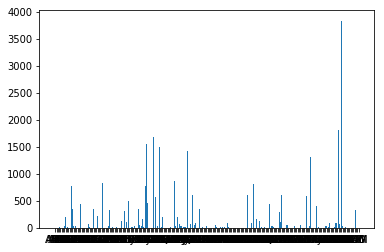

In [10]:
male_medals_per_country = {}
countries = []
medals = []
for country in male_country_dictionary:
    gold_count = 0
    silver_count = 0
    bronze_count = 0
    for sport in male_country_dictionary[country]:
        for athlete_index in male_country_dictionary[country][sport]:
            for year in male_country_dictionary[country][sport][athlete_index]:
                for (event, medal) in male_country_dictionary[country][sport][athlete_index][year]['event']:
                    if medal == 'Gold':
                        gold_count += 1
                    elif medal == 'Silver':
                        silver_count += 1
                    elif medal == 'Bronze':
                        bronze_count += 1
    male_medals_per_country[country] = gold_count + silver_count + bronze_count
    countries.append(country)
    medals.append(gold_count + silver_count + bronze_count)
    
plt.bar(countries, medals)
plt.show()

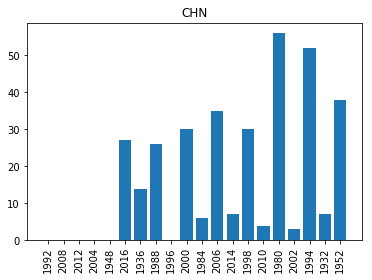

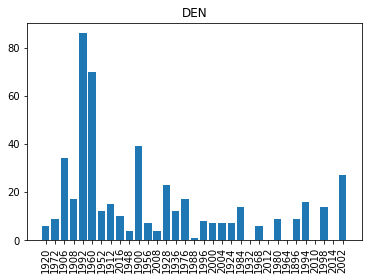

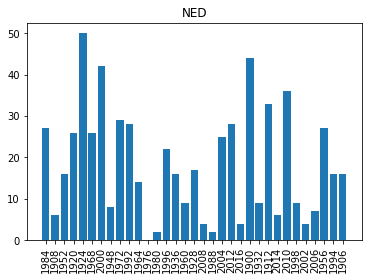

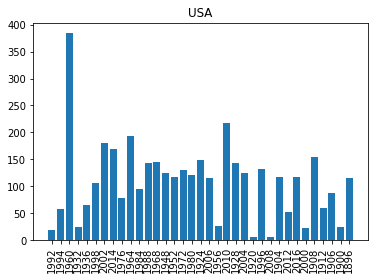

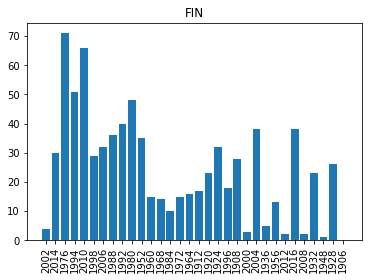

...

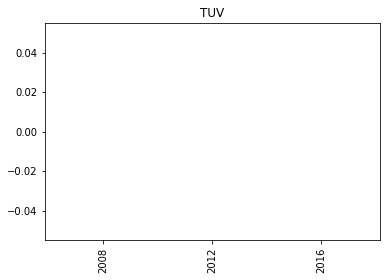

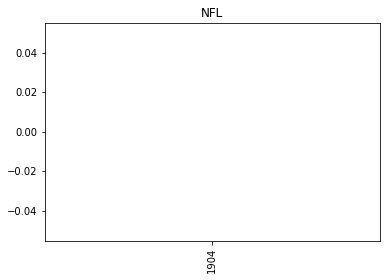

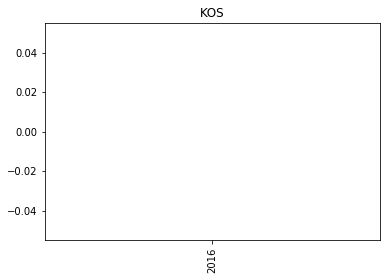

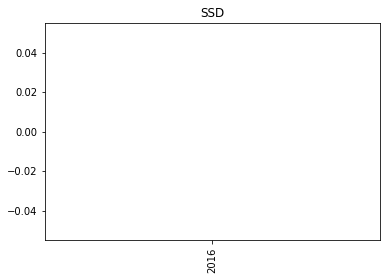

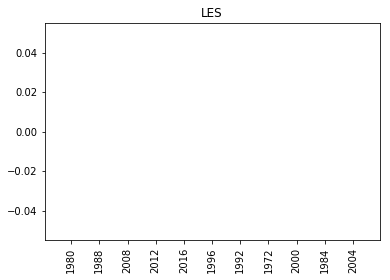

In [11]:
male_medals_per_country_per_year = {}
countries = []
medals = []
for country in male_country_dictionary:
    male_medals_per_country_per_year[country] = {}
    for sport in male_country_dictionary[country]:
        for athlete_index in male_country_dictionary[country][sport]:
            for year in male_country_dictionary[country][sport][athlete_index]:
                if year not in male_medals_per_country_per_year[country]:
                    male_medals_per_country_per_year[country][year] = {}
                    male_medals_per_country_per_year[country][year]['gold'] = 0
                    male_medals_per_country_per_year[country][year]['silver'] = 0
                    male_medals_per_country_per_year[country][year]['bronze'] = 0
                for (event, medal) in male_country_dictionary[country][sport][athlete_index][year]['event']:
                    if medal == 'Gold':
                        male_medals_per_country_per_year[country][year]['gold'] += 1
                    elif medal == 'Silver':
                        male_medals_per_country_per_year[country][year]['silver'] += 1
                    elif medal == 'Bronze':
                        male_medals_per_country_per_year[country][year]['bronze'] += 1
                        
for country in male_medals_per_country_per_year:
    years_medals = []
    
    for year in male_medals_per_country_per_year[country]:
        total_medals = male_medals_per_country_per_year[country][year]['gold']\
            + male_medals_per_country_per_year[country][year]['silver']\
            + male_medals_per_country_per_year[country][year]['bronze']
        years_medals.append((year, total_medals))
    sorted(years_medals, key=lambda x: x[0])
    
    plt.bar([i[0] for i in years_medals], [i[1] for i in years_medals])
    plt.xticks(range(len([i[0] for i in years_medals])), [i[0] for i in years_medals], rotation='vertical')
    plt.title(country)
    plt.show()

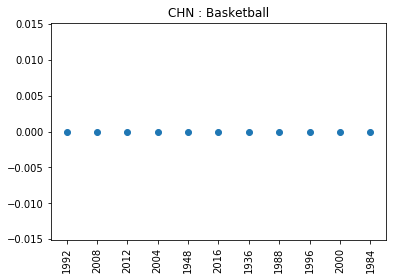

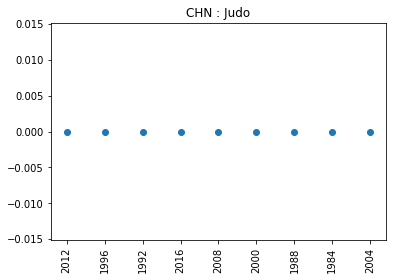

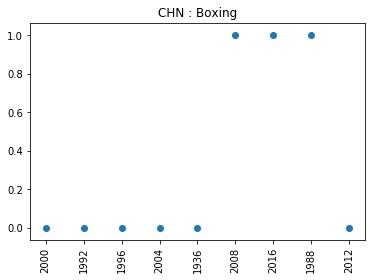

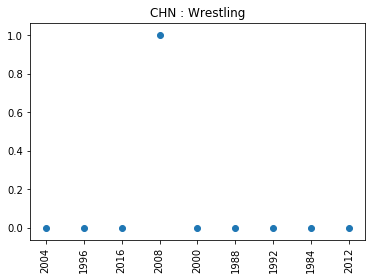

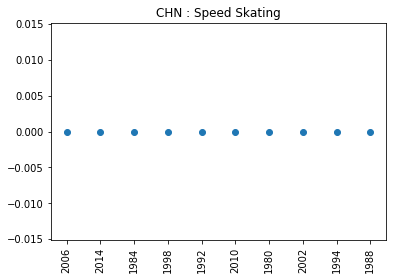

...

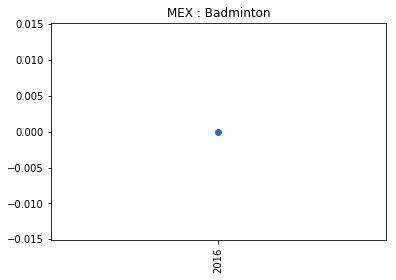

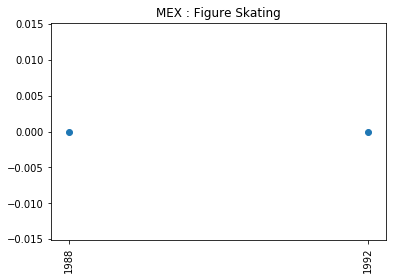

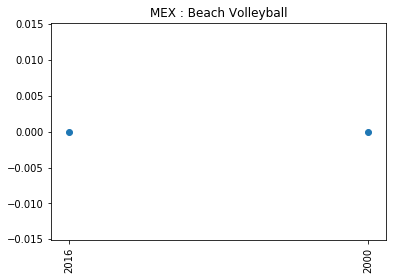

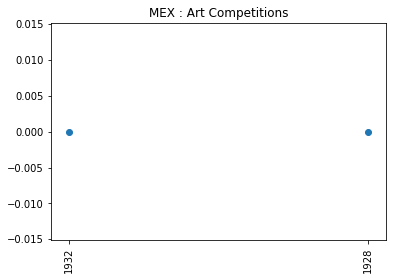

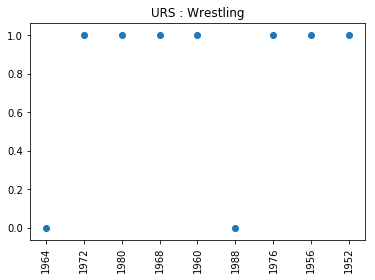

KeyboardInterrupt: 

In [12]:
male_medals_per_country_per_year_per_sport = {}
countries = []
medals = []
for country in male_country_dictionary:
    male_medals_per_country_per_year_per_sport[country] = {}
    for sport in male_country_dictionary[country]:
        male_medals_per_country_per_year_per_sport[country][sport] = {}
        for athlete_index in male_country_dictionary[country][sport]:
            for year in male_country_dictionary[country][sport][athlete_index]:
                if year not in male_medals_per_country_per_year_per_sport[country]:
                    male_medals_per_country_per_year_per_sport[country][sport][year] = {}
                    male_medals_per_country_per_year_per_sport[country][sport][year]['gold'] = 0
                    male_medals_per_country_per_year_per_sport[country][sport][year]['silver'] = 0
                    male_medals_per_country_per_year_per_sport[country][sport][year]['bronze'] = 0
                for (event, medal) in male_country_dictionary[country][sport][athlete_index][year]['event']:
                    if medal == 'Gold':
                        male_medals_per_country_per_year_per_sport[country][sport][year]['gold'] += 1
                    elif medal == 'Silver':
                        male_medals_per_country_per_year_per_sport[country][sport][year]['silver'] += 1
                    elif medal == 'Bronze':
                        male_medals_per_country_per_year_per_sport[country][sport][year]['bronze'] += 1
                        
for country in male_medals_per_country_per_year_per_sport:
    for sport in male_medals_per_country_per_year_per_sport[country]:
        years_medals = []

        for year in male_medals_per_country_per_year_per_sport[country][sport]:
            total_medals = male_medals_per_country_per_year_per_sport[country][sport][year]['gold']\
                + male_medals_per_country_per_year_per_sport[country][sport][year]['silver']\
                + male_medals_per_country_per_year_per_sport[country][sport][year]['bronze']
            years_medals.append(((year), total_medals))
        sorted(years_medals, key=lambda x: x[0])

        x = [i[0] for i in years_medals]
        y = [i[1] for i in years_medals]
        plt.scatter(x, y)
        plt.xticks(range(len([i[0] for i in years_medals])), [i[0] for i in years_medals], rotation='vertical')
#         z = np.polyfit(x, y, 2)
#         p = np.poly1d(z)
#         plt.plot(x,p(x),"r--")
        plt.title(country +" : "+ sport)
        plt.show()

In [13]:
datafile = 'data/athlete_events.txt'
athlete_dictionary = {}
country_dictionary = {}
sport_dictionary = {}

with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        sport = row[12]
        event = row[13]
        sport_dictionary[sport] = {}


with open(datafile, 'r') as csvfile:
    spamreader = csv.reader(csvfile, delimiter='\t', quotechar='|')
    first = 1
    for row in spamreader:
        if first == 1:
            first = 0
            continue
        index = row[0]
        name = row[1]
        sex = row[2]
        age = row[3]
        height = row[4]
        weight = row[5]
        team = row[6]
        noc = row[7]
        games = row[8]
        year = row[9]
        season = row[10]
        city = row[11]
        sport = row[12]
        event = row[13]
        medal = row[14]
        if medal == 'NA':
            medal = 0
        

        if year not in sport_dictionary[sport]:
            year_dict = {}
            ath_dict = {}
            if sex == 'F':
                continue  
            ath_dict['event'] = [(event, medal)]
            ath_dict['height'] = height
            ath_dict['weight'] = weight
            year_dict[index] = ath_dict
            sport_dictionary[sport][year] = year_dict

        elif year in sport_dictionary[sport]:
            if index not in sport_dictionary[sport][year]:
                ath_dict = {}
                if sex == 'F':
                    continue  
                ath_dict['event'] = [(event, medal)]
                ath_dict['height'] = height
                ath_dict['weight'] = weight
                sport_dictionary[sport][year][index] = ath_dict
                
            elif index in sport_dictionary[sport][year]:
                sport_dictionary[sport][year][index]['event'].append((event, medal))


male_sports_dictionary = sport_dictionary

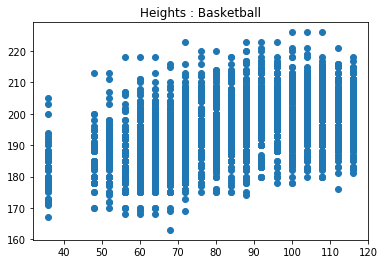

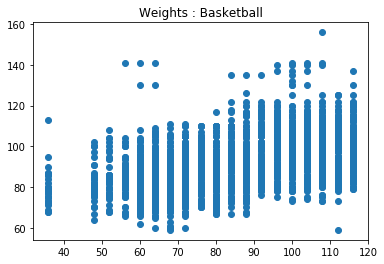

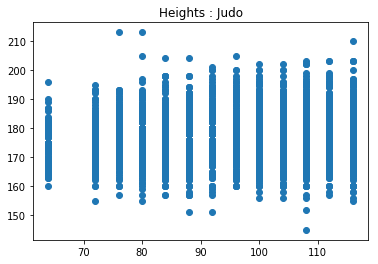

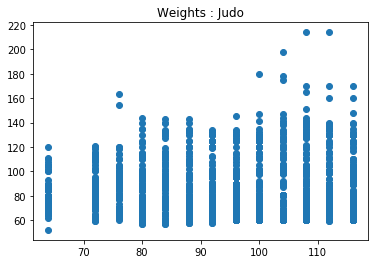

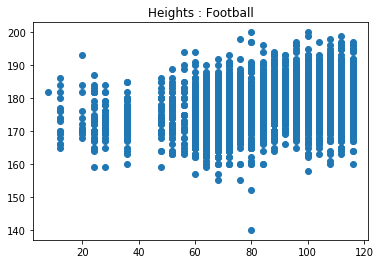

...

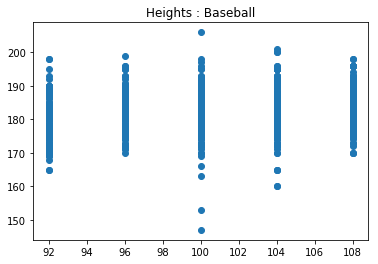

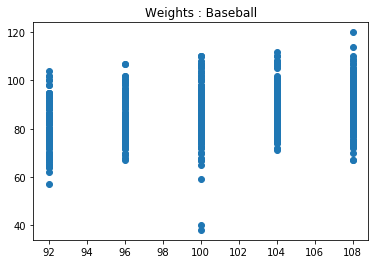

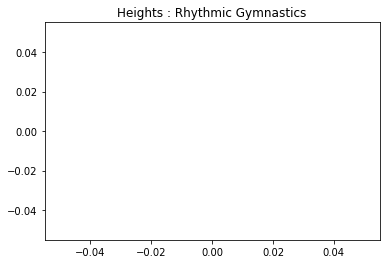

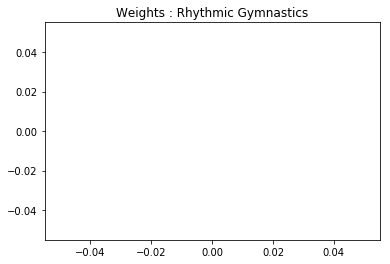

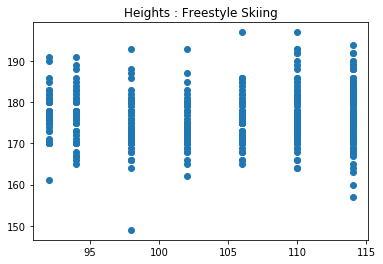

KeyboardInterrupt: 

In [14]:
for sport in male_sports_dictionary:
    years_heights = []
    years_weights = []
    heights = []
    weights = []
    for year in male_sports_dictionary[sport]:
        for athlete in male_sports_dictionary[sport][year]:
            
            if male_sports_dictionary[sport][year][athlete]['height'] != 'NA':
                years_heights.append(int(year)-1900)
                heights.append(int(male_sports_dictionary[sport][year][athlete]['height']))
            if male_sports_dictionary[sport][year][athlete]['weight'] != 'NA':
                years_weights.append(int(year)-1900)
                weights.append(float(male_sports_dictionary[sport][year][athlete]['weight']))
            
    plt.scatter(years_heights, heights)
    plt.title("Heights : "+ sport)
    plt.show()
    plt.scatter(years_weights, weights)
    plt.title("Weights : "+ sport)
    plt.show()

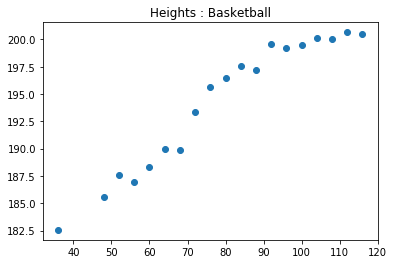

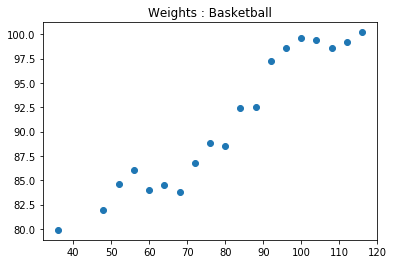

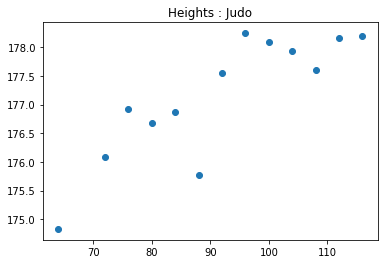

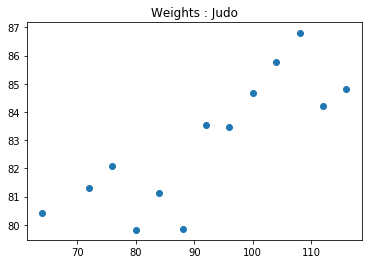

/Users/michellezhao/anaconda3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/michellezhao/anaconda3/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


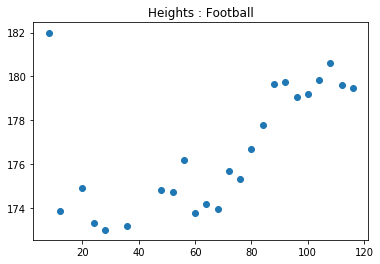

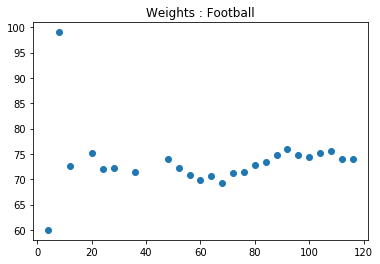

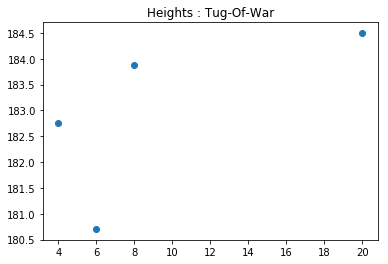

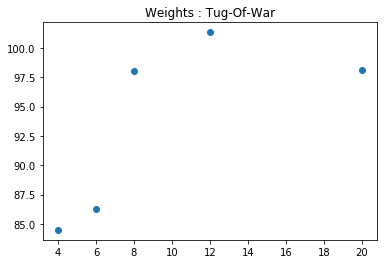

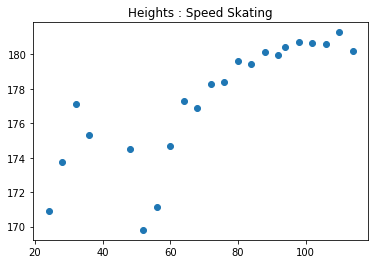

...

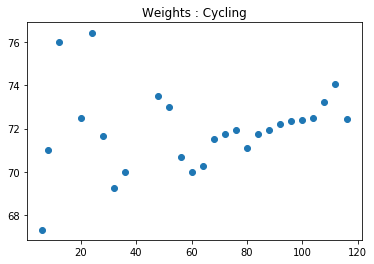

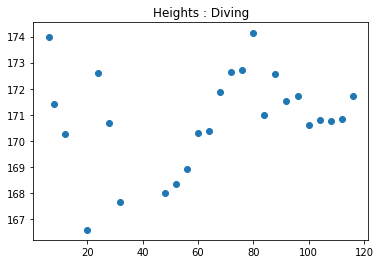

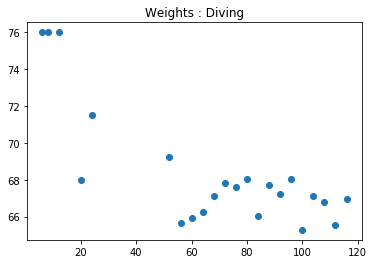

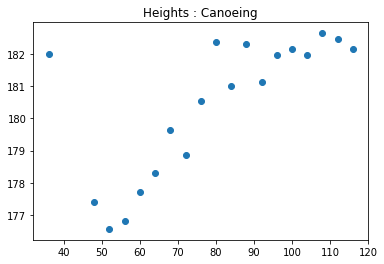

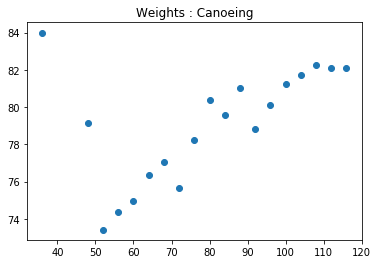

KeyboardInterrupt: 

In [15]:
for sport in male_sports_dictionary:
    years_heights = []
    years_weights = []
    avg_heights = []
    avg_weights = []
    for year in male_sports_dictionary[sport]:
        heights = []
        weights = []
        for athlete in male_sports_dictionary[sport][year]:
            if male_sports_dictionary[sport][year][athlete]['height'] != 'NA':
                heights.append(int(male_sports_dictionary[sport][year][athlete]['height']))
            if male_sports_dictionary[sport][year][athlete]['weight'] != 'NA':
                weights.append(float(male_sports_dictionary[sport][year][athlete]['weight']))
        years_heights.append(int(year)-1900)
        years_weights.append(int(year)-1900)
        avg_heights.append(np.mean(heights))
        avg_weights.append(np.mean(weights))
        
    plt.scatter(years_heights, avg_heights)
    plt.title("Heights : "+ sport)
    plt.show()
    plt.scatter(years_weights, avg_weights)
    plt.title("Weights : "+ sport)
    plt.show()

# Sliding Window LSTM First Attempt


In [80]:
male_medals_per_country_per_year = {}
countries = []
medals = []
for country in male_country_dictionary:
    male_medals_per_country_per_year[country] = {}
    for sport in male_country_dictionary[country]:
        for athlete_index in male_country_dictionary[country][sport]:
            for year in male_country_dictionary[country][sport][athlete_index]:
                if year not in male_medals_per_country_per_year[country]:
                    male_medals_per_country_per_year[country][year] = {}
                    male_medals_per_country_per_year[country][year]['gold'] = 0
                    male_medals_per_country_per_year[country][year]['silver'] = 0
                    male_medals_per_country_per_year[country][year]['bronze'] = 0
                for (event, medal) in male_country_dictionary[country][sport][athlete_index][year]['event']:
                    if medal == 'Gold':
                        male_medals_per_country_per_year[country][year]['gold'] += 1
                    elif medal == 'Silver':
                        male_medals_per_country_per_year[country][year]['silver'] += 1
                    elif medal == 'Bronze':
                        male_medals_per_country_per_year[country][year]['bronze'] += 1
                        
trainX = []
trainY = []
all_data = []
window = 3
for country in male_medals_per_country_per_year:
    years_medals = []
    
    for year in male_medals_per_country_per_year[country]:
        total_medals = male_medals_per_country_per_year[country][year]['gold']\
            + male_medals_per_country_per_year[country][year]['silver']\
            + male_medals_per_country_per_year[country][year]['bronze']
        years_medals.append((year, total_medals))
    sorted(years_medals, key=lambda x: x[0])
    years = [i[0] for i in years_medals]
    medal_count = [i[1] for i in years_medals]
    
    if len(years) < 4:
        continue
    idx = 0
    all_data.append(medal_count)
    while idx+3 < len(years):
#         addX = medal_count[idx:idx+3]
#         addY = medal_count[idx+3]
        trainX.append(medal_count[idx:idx+3])
        trainY.append(medal_count[idx+3])
        idx += 1


In [81]:
np.array(trainX).shape

(2618, 3)

In [91]:
import numpy as numpy

trainX = np.array(trainX)[:len(trainX)-100]
trainY = np.array(trainY)[:len(trainY)-100]
testX = np.array(trainX)[len(trainX)-100:]
testY = np.array(trainY)[len(trainY)-100:]

# convert an array of values into a dataset matrix
# def create_dataset(dataset, dataX, dataY, look_back=1):
#     for i in range(len(dataset)-look_back-1):
#         a = dataset[i:(i+look_back), 0]
#         np.append(dataX, a)
#         np.append(dataY, dataset[i + look_back, 0])
#     return numpy.array(dataX), numpy.array(dataY)

# normalize the dataset
# scaler = MinMaxScaler(feature_range=(0, 1))
# all_dataset = []
# for data in all_data:
#     all_dataset.append(scaler.fit_transform(data))
    
# split into train and test sets
# trainX, trainY = np.array([]), np.array([])
# testX, testY = np.array([]), np.array([])
# for dataset in all_dataset:
#     train_size = int(len(dataset) * 0.67)
#     test_size = len(dataset) - train_size
#     train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
#     look_back = 3
#     trainX, trainY = create_dataset(train, trainX, trainY,  look_back)
#     testX, testY = create_dataset(test, testX, testY, look_back)

trainX = numpy.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = numpy.reshape(testX, (testX.shape[0], 1, testX.shape[1]))


# create and fit the LSTM network
look_back = 3
model = Sequential()
model.add(LSTM(4, input_shape=(1, 3)))
model.add(Dense(2418))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(dataset)
trainPredictPlot[:, :] = numpy.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(dataset)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

plt.plot(scaler.inverse_transform(dataset)[len(dataset)-100:])
#     plt.plot(trainPredictPlot[len(testPredictPlot):])
plt.plot(testPredictPlot[len(testPredictPlot)-100:], color = 'g')
plt.show()



ValueError: cannot reshape array of size 5754 into shape (1918,1,1)

In [88]:
trainX.shape

(2218, 3)

In [68]:
data

[26, 56, 52, 30, 0, 38, 0, 14, 30, 35, 27, 4, 7, 6, 3, 0, 7, 0, 0, 0]